In [1]:
## Import Packages
import numpy as np
import _pickle as pk
import Area_Avg as aa
from matplotlib import pyplot as plt
import matplotlib as mpl
from netCDF4 import Dataset
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point

plt.rcParams['axes.xmargin'] = 0 #default margin spacing for the edges
mpl.rc('font',size=40,**{'family':'sans-serif','sans-serif':['Arial']})
%matplotlib inline

In [2]:
#load in cloud feedbacks and dimensions as needed
Models = ['5SST','5SSTu','2SST','2SSTu']
props = ['Standard', 'Amount', 'Altitude', 'Optical Depth', 'Residual', 'Sum']

data_sw = {}
data_lw = {}
for m in range(4):
    data_sw[Models[m]] = {}
    data_lw[Models[m]] = {}
    for p in range(6):
        data_sw[Models[m]][props[p]] = pk.load(open(\
        'Data/CanESM5_p2/Custom/Fluxes/CanESM5_p2_Custom_TrCLsw_FB_MZdecomp_Grid.pi','rb'))\
        [props[p]][Models[m]]
    
        data_lw[Models[m]][props[p]] = pk.load(open(\
        'Data/CanESM5_p2/Custom/Fluxes/CanESM5_p2_Custom_TrCLlw_FB_MZdecomp_Grid.pi','rb'))\
        [props[p]][Models[m]]

lat = np.linspace(-87.864,87.864,64)
lon = np.linspace(0,357.1875,128)

y = lat*np.pi/180
coslat = np.cos(y)
coslat = np.tile(coslat,(lon.size,1)).T

In [8]:
data_sw_plot = dict()
data_lw_plot = dict()
data_lw_gam = dict()
data_sw_gam = dict()
for mods in data_sw.keys():
    data_sw_plot[mods] = dict()
    data_lw_plot[mods] = dict()
    
    data_sw_gam[mods] = dict()
    data_lw_gam[mods] = dict()
    
    for prop in data_sw[mods].keys():
        data_sw_plot[mods][prop] = dict()
        data_lw_plot[mods][prop] = dict()
        
        data_sw_gam[mods][prop] = dict()
        data_lw_gam[mods][prop] = dict()
        
        for ctp in data_sw[mods][prop].keys():
            data_sw_gam[mods][prop][ctp] = np.average(np.nanmean(\
            data_sw[mods][prop][ctp],axis=0),weights=coslat)
            data_lw_gam[mods][prop][ctp] = np.average(np.nanmean(\
            data_lw[mods][prop][ctp],axis=0),weights=coslat)
            
            data_sw_plot[mods][prop][ctp] = np.nanmean(np.concatenate((\
            data_sw[mods][prop][ctp][:,:,64:],data_sw[mods][prop][ctp][:,:,0:64]),axis=2),axis=0)
            
            data_sw_plot[mods][prop][ctp],lon_cyc = add_cyclic_point(\
            data_sw_plot[mods][prop][ctp],lon)
            
            data_lw_plot[mods][prop][ctp] = np.nanmean(np.concatenate((\
            data_lw[mods][prop][ctp][:,:,64:],data_lw[mods][prop][ctp][:,:,0:64]),axis=2),axis=0)
            
            data_lw_plot[mods][prop][ctp],lon_cyc = add_cyclic_point(\
            data_lw_plot[mods][prop][ctp],lon)

Low Cloud Amount & High Cloud Optical Depth

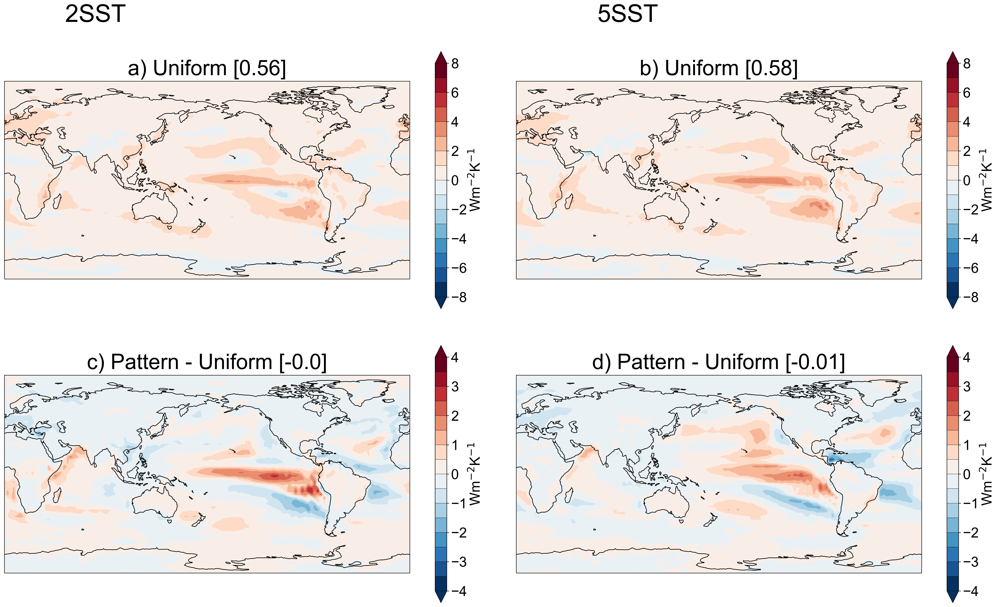

In [11]:
mpl.rc('font',size=23,**{'family':'sans-serif','sans-serif':['Arial']})
bounds = np.arange(-8,8.1,1)
bounds_ticks = np.arange(-8,8.1,2)
cmap = plt.cm.RdBu_r
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

bounds_diff = np.arange(-4,4.1,0.5)
bounds_diff_ticks = np.arange(-4,4.1,1)
norm_diff = mpl.colors.BoundaryNorm(bounds_diff, cmap.N)

fig = plt.figure(figsize=(30,20),dpi=300)
#gs = gridspec.GridSpec(3,2, width_ratios=[0.6,1],height_ratios=[1,1,1]) 
#plt.suptitle('SW Low Cloud Amount Feedback')

#5SSTu------------------
ax = plt.subplot(221,projection=ccrs.PlateCarree(central_longitude=180))
ax.set_title('a) Uniform [{}]'.format(round(data_sw_gam['2SSTu']['Amount']['Low'],2)),\
             fontsize=35,pad=10)
im = ax.contourf(lon_cyc,lat,data_sw_plot['2SSTu']['Amount']['Low'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax.coastlines()
plt.colorbar(im,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)
plt.text(0.15,1.3,'2SST',fontsize=40,transform = ax.transAxes)

ax1 = plt.subplot(222,projection=ccrs.PlateCarree(central_longitude=180))
ax1.set_title('b) Uniform [{}]'.format(round(data_sw_gam['5SSTu']['Amount']['Low'],2)),\
             fontsize=35,pad=10)
im1 = ax1.contourf(lon_cyc,lat,data_sw_plot['5SSTu']['Amount']['Low'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax1.coastlines()
plt.colorbar(im1,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)
plt.text(0.2,1.3,'5SST',fontsize=40,transform = ax1.transAxes)

#CanESM5 minus 5SSTu------------------
ax4 = plt.subplot(223,projection=ccrs.PlateCarree(central_longitude=180))
ax4.set_title('c) Pattern - Uniform [{}]'.format(round(\
    data_sw_gam['2SST']['Amount']['Low']-\
    data_sw_gam['2SSTu']['Amount']['Low'],2)),fontsize=35,pad=10)
im4 = ax4.contourf(lon_cyc,lat,data_sw_plot['2SST']['Amount']['Low']-\
                   data_sw_plot['2SSTu']['Amount']['Low'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax4.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax5 = plt.subplot(224,projection=ccrs.PlateCarree(central_longitude=180))
ax5.set_title('d) Pattern - Uniform [{}]'.format(round(\
    data_sw_gam['5SST']['Amount']['Low']-data_sw_gam['5SSTu']['Amount']['Low'],2)),\
             fontsize=35,pad=10)
im5 = ax5.contourf(lon_cyc,lat,data_sw_plot['5SST']['Amount']['Low']-\
                   data_sw_plot['5SSTu']['Amount']['Low'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax5.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

plt.subplots_adjust(wspace=0.01, hspace=-0.2)

plt.savefig('CLD_Custom_LowAmt_FB_Map.eps',bbox_inches='tight')

High Cloud Amount

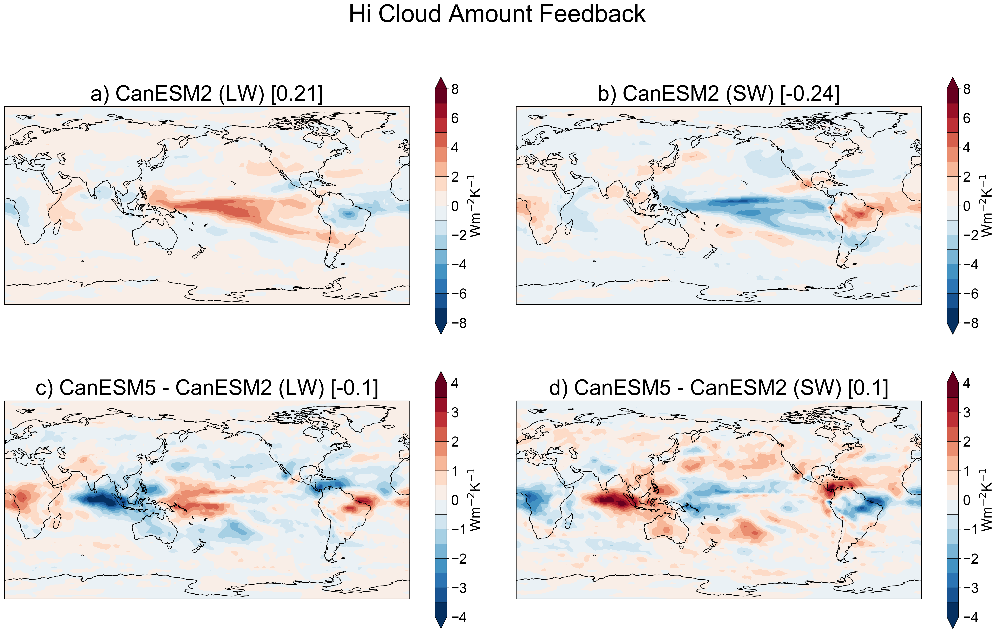

In [26]:
mpl.rc('font',size=23,**{'family':'sans-serif','sans-serif':['Arial']})
bounds = np.arange(-8,8.1,1)
bounds_ticks = np.arange(-8,8.1,2)
cmap = plt.cm.RdBu_r
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

bounds_diff = np.arange(-4,4.1,0.5)
bounds_diff_ticks = np.arange(-4,4.1,1)
norm_diff = mpl.colors.BoundaryNorm(bounds_diff, cmap.N)

fig = plt.figure(figsize=(30,20),dpi=300)
plt.suptitle('Hi Cloud Amount Feedback',fontsize=40,y=0.9)
#gs = gridspec.GridSpec(3,2, width_ratios=[0.6,1],height_ratios=[1,1,1]) 

#CanESM2------------------
ax = plt.subplot(221,projection=ccrs.PlateCarree(central_longitude=180))
ax.set_title('a) CanESM2 (LW) [{}]'.format(round(data_lw_gam['CanESM2']['Amount']['Hi'],2)),\
             fontsize=35,pad=10)
im = ax.contourf(lon_cyc,lat,data_lw_plot['CanESM2']['Amount']['Hi'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax.coastlines()
plt.colorbar(im,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax1 = plt.subplot(222,projection=ccrs.PlateCarree(central_longitude=180))
ax1.set_title('b) CanESM2 (SW) [{}]'.format(round(data_sw_gam['CanESM2']['Amount']['Hi'],2)),\
             fontsize=35,pad=10)
im1 = ax1.contourf(lon_cyc,lat,data_sw_plot['CanESM2']['Amount']['Hi'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax1.coastlines()
plt.colorbar(im1,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5-D minus CanESM2------------------
#ax2 = plt.subplot(323,projection=ccrs.PlateCarree(central_longitude=180))
#ax2.set_title('CanESM5-D - CanESM2 (LW)',fontsize=40,pad=10)
#im2 = ax2.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p6']['Amount']['Hi']-\
#                   data_lw_plot['CanESM2']['Amount']['Hi'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax2.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#ax3 = plt.subplot(324,projection=ccrs.PlateCarree(central_longitude=180))
#ax3.set_title('CanESM5-D - CanESM2 (SW)',fontsize=40,pad=10)
#im3 = ax3.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p6']['Amount']['Hi']-\
#                   data_sw_plot['CanESM2']['Amount']['Hi'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax3.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5 minus CanESM2------------------
ax4 = plt.subplot(223,projection=ccrs.PlateCarree(central_longitude=180))
ax4.set_title('c) CanESM5 - CanESM2 (LW) [{}]'.format(round(\
    data_lw_gam['CanESM5_p2']['Amount']['Hi']-data_lw_gam['CanESM2']['Amount']['Hi'],2)),\
             fontsize=35,pad=10)
im4 = ax4.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p2']['Amount']['Hi']-\
                   data_lw_plot['CanESM2']['Amount']['Hi'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax4.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax5 = plt.subplot(224,projection=ccrs.PlateCarree(central_longitude=180))
ax5.set_title('d) CanESM5 - CanESM2 (SW) [{}]'.format(round(\
    data_sw_gam['CanESM5_p2']['Amount']['Hi']-data_sw_gam['CanESM2']['Amount']['Hi'],2)),\
             fontsize=35,pad=10)
im5 = ax5.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p2']['Amount']['Hi']-\
                   data_sw_plot['CanESM2']['Amount']['Hi'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax5.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

plt.subplots_adjust(wspace=0.01,hspace=-0.2)

plt.savefig('CLD_HiAmt_FB_Map.eps',bbox_inches='tight')

## Optical Depth

Low

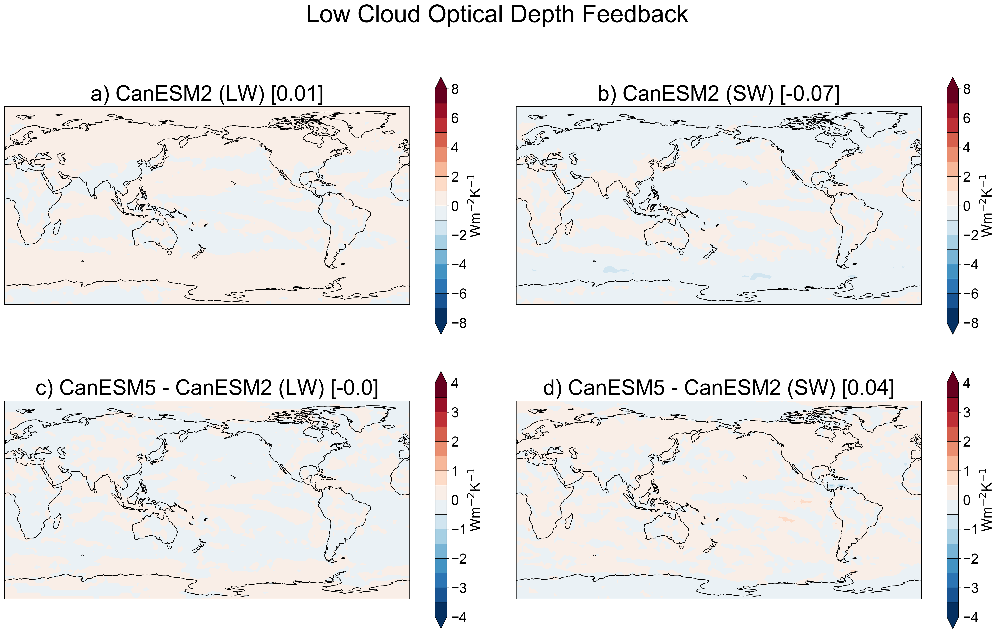

In [27]:
mpl.rc('font',size=23,**{'family':'sans-serif','sans-serif':['Arial']})
bounds = np.arange(-8,8.1,1)
bounds_ticks = np.arange(-8,8.1,2)
cmap = plt.cm.RdBu_r
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

bounds_diff = np.arange(-4,4.1,0.5)
bounds_diff_ticks = np.arange(-4,4.1,1)
norm_diff = mpl.colors.BoundaryNorm(bounds_diff, cmap.N)

fig = plt.figure(figsize=(30,20),dpi=300)
plt.suptitle('Low Cloud Optical Depth Feedback',fontsize=40,y=0.9)
#gs = gridspec.GridSpec(3,2, width_ratios=[0.6,1],height_ratios=[1,1,1]) 

#CanESM2------------------
ax = plt.subplot(221,projection=ccrs.PlateCarree(central_longitude=180))
ax.set_title('a) CanESM2 (LW) [{}]'.format(round(data_lw_gam['CanESM2']['Optical Depth']['Low'],2)),\
             fontsize=35,pad=10)
im = ax.contourf(lon_cyc,lat,data_lw_plot['CanESM2']['Optical Depth']['Low'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax.coastlines()
plt.colorbar(im,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax1 = plt.subplot(222,projection=ccrs.PlateCarree(central_longitude=180))
ax1.set_title('b) CanESM2 (SW) [{}]'.format(round(data_sw_gam['CanESM2']['Optical Depth']['Low'],2)),\
             fontsize=35,pad=10)
im1 = ax1.contourf(lon_cyc,lat,data_sw_plot['CanESM2']['Optical Depth']['Low'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax1.coastlines()
plt.colorbar(im1,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5-D minus CanESM2------------------
#ax2 = plt.subplot(323,projection=ccrs.PlateCarree(central_longitude=180))
#ax2.set_title('CanESM5-D - CanESM2 (LW)',fontsize=40,pad=10)
#im2 = ax2.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p6']['Optical Depth']['Low']-\
#                   data_lw_plot['CanESM2']['Optical Depth']['Low'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax2.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#ax3 = plt.subplot(324,projection=ccrs.PlateCarree(central_longitude=180))
#ax3.set_title('CanESM5-D - CanESM2 (SW)',fontsize=40,pad=10)
#im3 = ax3.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p6']['Optical Depth']['Low']-\
#                   data_sw_plot['CanESM2']['Optical Depth']['Low'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax3.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5 minus CanESM2------------------
ax4 = plt.subplot(223,projection=ccrs.PlateCarree(central_longitude=180))
ax4.set_title('c) CanESM5 - CanESM2 (LW) [{}]'.format(round(\
    data_lw_gam['CanESM5_p2']['Optical Depth']['Low']-data_lw_gam['CanESM2']['Optical Depth']['Low'],2)),\
             fontsize=35,pad=10)
im4 = ax4.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p2']['Optical Depth']['Low']-\
                   data_lw_plot['CanESM2']['Optical Depth']['Low'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax4.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax5 = plt.subplot(224,projection=ccrs.PlateCarree(central_longitude=180))
ax5.set_title('d) CanESM5 - CanESM2 (SW) [{}]'.format(round(\
    data_sw_gam['CanESM5_p2']['Optical Depth']['Low']-data_sw_gam['CanESM2']['Optical Depth']['Low'],2)),\
             fontsize=35,pad=10)
im5 = ax5.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p2']['Optical Depth']['Low']-\
                   data_sw_plot['CanESM2']['Optical Depth']['Low'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax5.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

plt.subplots_adjust(wspace=0.01,hspace=-0.2)

plt.savefig('CLD_LowOpt_FB_Map.eps',bbox_inches='tight')

Hi

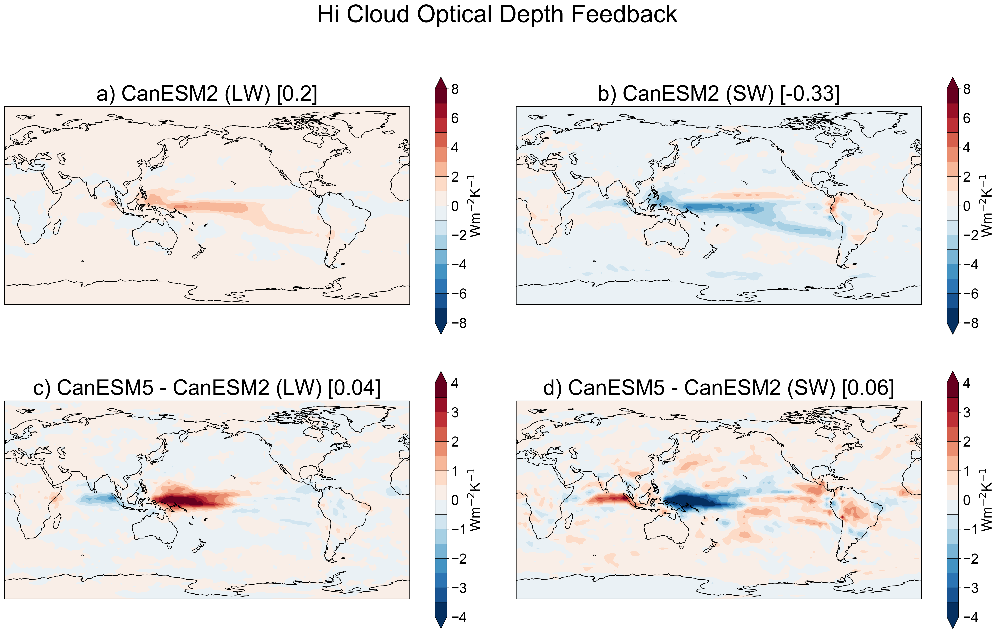

In [28]:
mpl.rc('font',size=23,**{'family':'sans-serif','sans-serif':['Arial']})
bounds = np.arange(-8,8.1,1)
bounds_ticks = np.arange(-8,8.1,2)
cmap = plt.cm.RdBu_r
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

bounds_diff = np.arange(-4,4.1,0.5)
bounds_diff_ticks = np.arange(-4,4.1,1)
norm_diff = mpl.colors.BoundaryNorm(bounds_diff, cmap.N)

fig = plt.figure(figsize=(30,20),dpi=300)
plt.suptitle('Hi Cloud Optical Depth Feedback',fontsize=40,y=0.9)
#gs = gridspec.GridSpec(3,2, width_ratios=[0.6,1],height_ratios=[1,1,1]) 

#CanESM2------------------
ax = plt.subplot(221,projection=ccrs.PlateCarree(central_longitude=180))
ax.set_title('a) CanESM2 (LW) [{}]'.format(round(data_lw_gam['CanESM2']['Optical Depth']['Hi'],2)),\
             fontsize=35,pad=10)
im = ax.contourf(lon_cyc,lat,data_lw_plot['CanESM2']['Optical Depth']['Hi'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax.coastlines()
plt.colorbar(im,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax1 = plt.subplot(222,projection=ccrs.PlateCarree(central_longitude=180))
ax1.set_title('b) CanESM2 (SW) [{}]'.format(round(data_sw_gam['CanESM2']['Optical Depth']['Hi'],2)),\
             fontsize=35,pad=10)
im1 = ax1.contourf(lon_cyc,lat,data_sw_plot['CanESM2']['Optical Depth']['Hi'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax1.coastlines()
plt.colorbar(im1,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5-D minus CanESM2------------------
#ax2 = plt.subplot(323,projection=ccrs.PlateCarree(central_longitude=180))
#ax2.set_title('CanESM5-D - CanESM2 (LW)',fontsize=40,pad=10)
#im2 = ax2.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p6']['Optical Depth']['Hi']-\
#                   data_lw_plot['CanESM2']['Optical Depth']['Hi'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax2.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#ax3 = plt.subplot(324,projection=ccrs.PlateCarree(central_longitude=180))
#ax3.set_title('CanESM5-D - CanESM2 (SW)',fontsize=40,pad=10)
#im3 = ax3.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p6']['Optical Depth']['Hi']-\
#                   data_sw_plot['CanESM2']['Optical Depth']['Hi'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax3.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5 minus CanESM2------------------
ax4 = plt.subplot(223,projection=ccrs.PlateCarree(central_longitude=180))
ax4.set_title('c) CanESM5 - CanESM2 (LW) [{}]'.format(round(\
    data_lw_gam['CanESM5_p2']['Optical Depth']['Hi']-data_lw_gam['CanESM2']['Optical Depth']['Hi'],2)),\
             fontsize=35,pad=10)
im4 = ax4.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p2']['Optical Depth']['Hi']-\
                   data_lw_plot['CanESM2']['Optical Depth']['Hi'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax4.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax5 = plt.subplot(224,projection=ccrs.PlateCarree(central_longitude=180))
ax5.set_title('d) CanESM5 - CanESM2 (SW) [{}]'.format(round(\
    data_sw_gam['CanESM5_p2']['Optical Depth']['Hi']-data_sw_gam['CanESM2']['Optical Depth']['Hi'],2)),\
             fontsize=35,pad=10)
im5 = ax5.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p2']['Optical Depth']['Hi']-\
                   data_sw_plot['CanESM2']['Optical Depth']['Hi'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax5.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

plt.subplots_adjust(wspace=0.01,hspace=-0.2)

plt.savefig('CLD_HiOpt_FB_Map.eps',bbox_inches='tight')

## Altitude

Low

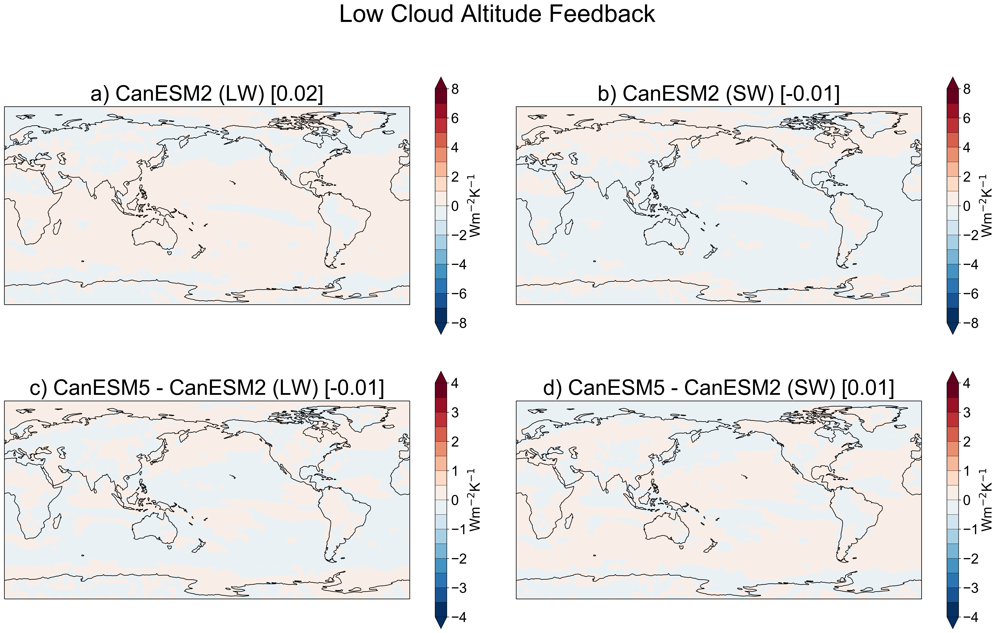

In [29]:
mpl.rc('font',size=23,**{'family':'sans-serif','sans-serif':['Arial']})
bounds = np.arange(-8,8.1,1)
bounds_ticks = np.arange(-8,8.1,2)
cmap = plt.cm.RdBu_r
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

bounds_diff = np.arange(-4,4.1,0.5)
bounds_diff_ticks = np.arange(-4,4.1,1)
norm_diff = mpl.colors.BoundaryNorm(bounds_diff, cmap.N)

fig = plt.figure(figsize=(30,20),dpi=300)
plt.suptitle('Low Cloud Altitude Feedback',fontsize=40,y=0.9)
#gs = gridspec.GridSpec(3,2, width_ratios=[0.6,1],height_ratios=[1,1,1]) 

#CanESM2------------------
ax = plt.subplot(221,projection=ccrs.PlateCarree(central_longitude=180))
ax.set_title('a) CanESM2 (LW) [{}]'.format(round(data_lw_gam['CanESM2']['Altitude']['Low'],2)),\
             fontsize=35,pad=10)
im = ax.contourf(lon_cyc,lat,data_lw_plot['CanESM2']['Altitude']['Low'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax.coastlines()
plt.colorbar(im,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax1 = plt.subplot(222,projection=ccrs.PlateCarree(central_longitude=180))
ax1.set_title('b) CanESM2 (SW) [{}]'.format(round(data_sw_gam['CanESM2']['Altitude']['Low'],2)),\
             fontsize=35,pad=10)
im1 = ax1.contourf(lon_cyc,lat,data_sw_plot['CanESM2']['Altitude']['Low'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax1.coastlines()
plt.colorbar(im1,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5-D minus CanESM2------------------
#ax2 = plt.subplot(323,projection=ccrs.PlateCarree(central_longitude=180))
#ax2.set_title('CanESM5-D - CanESM2 (LW)',fontsize=40,pad=10)
#im2 = ax2.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p6']['Altitude']['Low']-\
#                   data_lw_plot['CanESM2']['Altitude']['Low'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax2.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#ax3 = plt.subplot(324,projection=ccrs.PlateCarree(central_longitude=180))
#ax3.set_title('CanESM5-D - CanESM2 (SW)',fontsize=40,pad=10)
#im3 = ax3.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p6']['Altitude']['Low']-\
#                   data_sw_plot['CanESM2']['Altitude']['Low'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax3.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5 minus CanESM2------------------
ax4 = plt.subplot(223,projection=ccrs.PlateCarree(central_longitude=180))
ax4.set_title('c) CanESM5 - CanESM2 (LW) [{}]'.format(round(\
    data_lw_gam['CanESM5_p2']['Altitude']['Low']-data_lw_gam['CanESM2']['Altitude']['Low'],2)),\
             fontsize=35,pad=10)
im4 = ax4.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p2']['Altitude']['Low']-\
                   data_lw_plot['CanESM2']['Altitude']['Low'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax4.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax5 = plt.subplot(224,projection=ccrs.PlateCarree(central_longitude=180))
ax5.set_title('d) CanESM5 - CanESM2 (SW) [{}]'.format(round(\
    data_sw_gam['CanESM5_p2']['Altitude']['Low']-data_sw_gam['CanESM2']['Altitude']['Low'],2)),\
             fontsize=35,pad=10)
im5 = ax5.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p2']['Altitude']['Low']-\
                   data_sw_plot['CanESM2']['Altitude']['Low'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax5.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

plt.subplots_adjust(wspace=0.01,hspace=-0.2)
plt.savefig('CLD_LowAlt_FB_Map.eps',bbox_inches='tight')

High

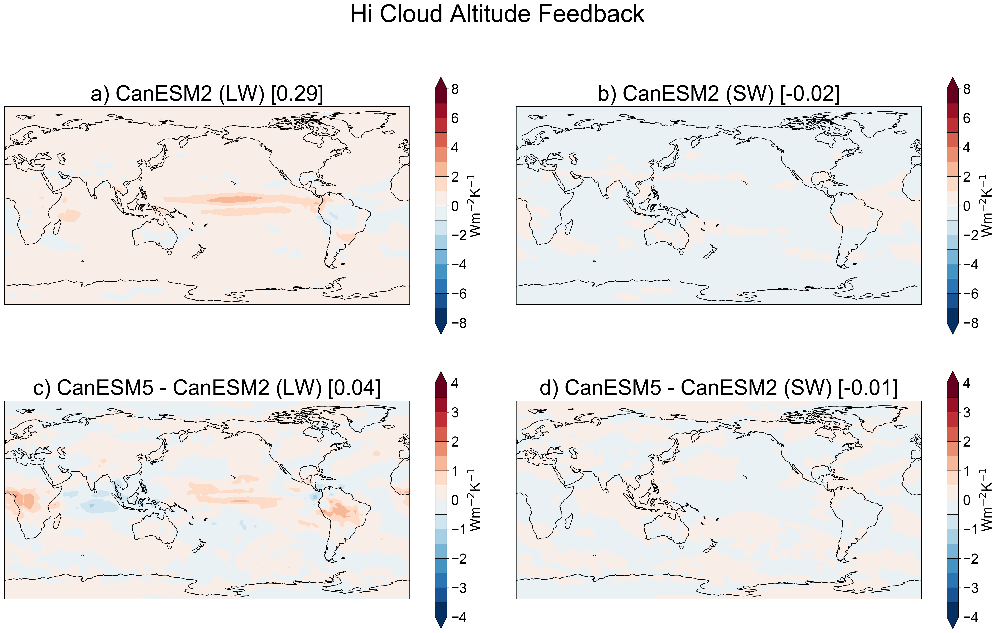

In [30]:
mpl.rc('font',size=23,**{'family':'sans-serif','sans-serif':['Arial']})
bounds = np.arange(-8,8.1,1)
bounds_ticks = np.arange(-8,8.1,2)
cmap = plt.cm.RdBu_r
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

bounds_diff = np.arange(-4,4.1,0.5)
bounds_diff_ticks = np.arange(-4,4.1,1)
norm_diff = mpl.colors.BoundaryNorm(bounds_diff, cmap.N)

fig = plt.figure(figsize=(30,20),dpi=300)
plt.suptitle('Hi Cloud Altitude Feedback',fontsize=40,y=0.9)
#gs = gridspec.GridSpec(3,2, width_ratios=[0.6,1],height_ratios=[1,1,1]) 

#CanESM2------------------
ax = plt.subplot(221,projection=ccrs.PlateCarree(central_longitude=180))
ax.set_title('a) CanESM2 (LW) [{}]'.format(round(data_lw_gam['CanESM2']['Altitude']['Hi'],2)),\
             fontsize=35,pad=10)
im = ax.contourf(lon_cyc,lat,data_lw_plot['CanESM2']['Altitude']['Hi'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax.coastlines()
plt.colorbar(im,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax1 = plt.subplot(222,projection=ccrs.PlateCarree(central_longitude=180))
ax1.set_title('b) CanESM2 (SW) [{}]'.format(round(data_sw_gam['CanESM2']['Altitude']['Hi'],2)),\
             fontsize=35,pad=10)
im1 = ax1.contourf(lon_cyc,lat,data_sw_plot['CanESM2']['Altitude']['Hi'],\
                   bounds,cmap=cmap,norm=norm,extend='both')
ax1.coastlines()
plt.colorbar(im1,ticks=bounds_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5-D minus CanESM2------------------
#ax2 = plt.subplot(323,projection=ccrs.PlateCarree(central_longitude=180))
#ax2.set_title('CanESM5-D - CanESM2 (LW)',fontsize=40,pad=10)
#im2 = ax2.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p6']['Altitude']['Hi']-\
#                   data_lw_plot['CanESM2']['Altitude']['Hi'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax2.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#ax3 = plt.subplot(324,projection=ccrs.PlateCarree(central_longitude=180))
#ax3.set_title('CanESM5-D - CanESM2 (SW)',fontsize=40,pad=10)
#im3 = ax3.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p6']['Altitude']['Hi']-\
#                   data_sw_plot['CanESM2']['Altitude']['Hi'],\
#                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
#ax3.coastlines()
#plt.colorbar(im2,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

#CanESM5 minus CanESM2------------------
ax4 = plt.subplot(223,projection=ccrs.PlateCarree(central_longitude=180))
ax4.set_title('c) CanESM5 - CanESM2 (LW) [{}]'.format(round(\
    data_lw_gam['CanESM5_p2']['Altitude']['Hi']-data_lw_gam['CanESM2']['Altitude']['Hi'],2)),\
             fontsize=35,pad=10)
im4 = ax4.contourf(lon_cyc,lat,data_lw_plot['CanESM5_p2']['Altitude']['Hi']-\
                   data_lw_plot['CanESM2']['Altitude']['Hi'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax4.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

ax5 = plt.subplot(224,projection=ccrs.PlateCarree(central_longitude=180))
ax5.set_title('d) CanESM5 - CanESM2 (SW) [{}]'.format(round(\
    data_sw_gam['CanESM5_p2']['Altitude']['Hi']-data_sw_gam['CanESM2']['Altitude']['Hi'],2)),\
             fontsize=35,pad=10)
im5 = ax5.contourf(lon_cyc,lat,data_sw_plot['CanESM5_p2']['Altitude']['Hi']-\
                   data_sw_plot['CanESM2']['Altitude']['Hi'],\
                   bounds_diff,cmap=cmap,norm=norm_diff,extend='both')
ax5.coastlines()
plt.colorbar(im4,ticks=bounds_diff_ticks,drawedges=True,label='Wm$^{-2}$K$^{-1}$',shrink=0.7)

plt.subplots_adjust(wspace=0.01,hspace=-0.2)

plt.savefig('CLD_HiAlt_FB_Map.eps',bbox_inches='tight')